### Passing the fixation point with the longest duration to SAM

In [23]:
import pandas as pd
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from segment_anything import SamPredictor, sam_model_registry
from PIL import Image

In [25]:
DIR = "/kaggle/input/df-pkl"
df = pd.read_pickle(os.path.join(DIR, "eye_tracking_data.pkl"))
#df.head()

In [26]:
# Function to find the fixation point with the longest duration
def get_longest_duration_point(durations, coordinates):
    if not isinstance(durations, list) or not isinstance(coordinates, list):
        return np.nan  # Handle invalid entries
    try:
        max_index = np.argmax(durations)  # Find index of the max duration
        return coordinates[max_index] if max_index < len(coordinates) else np.nan
    except:
        return np.nan  # Handle unexpected issues

# Apply the function to find the longest duration point for left and right eyes
df['longest_duration_point_left'] = df.apply(
    lambda row: get_longest_duration_point(row['image_duration_left'], row['image_coordinates_left']), axis=1
)

df['longest_duration_point_right'] = df.apply(
    lambda row: get_longest_duration_point(row['image_duration_right'], row['image_coordinates_right']), axis=1
)

#pd.set_option('display.max_colwidth', None) # Ensure cell contents are not truncated
df.head()

,class,image_file,width_height,offset,viewer,response,image_coordinates_left,image_start_end_time_left,image_duration_left,image_coordinates_right,image_start_end_time_right,image_duration_right,screen_coordinates_left,screen_coordinates_right,longest_duration_point_left,longest_duration_point_right
0,diningtable,2010_001366,"[332, 500]","[715, 279, 1215, 611]",1,1,"[(111.79999999999995, 256.79999999999995), (314.79999999999995, 224.8), (246.29999999999995, 167.7), (243.89999999999998, 196.39999999999998), (195.10000000000002, 226.5), (239.70000000000005, 223.60000000000002)]","[(7, 149), (186, 331), (359, 603), (618, 991), (1013, 1527), (1544, 1980)]","[142, 145, 244, 373, 514, 436]","[(100.79999999999995, 260.1), (304.70000000000005, 229.2), (232.89999999999998, 167.39999999999998), (230.79999999999995, 204.89999999999998), (198.60000000000002, 237.70000000000005), (244.70000000000005, 226.60000000000002)]","[(7, 147), (184, 331), (357, 600), (616, 990), (1010, 1527), (1544, 1980)]","[140, 147, 243, 374, 517, 436]","[(826.8, 535.8), (1029.8, 503.8), (961.3, 446.7), (958.9, 475.4), (910.1, 505.5), (954.7, 502.6)]","[(815.8, 539.1), (1019.7, 508.2), (947.9, 446.4), (945.8, 483.9), (913.6, 516.7), (959.7, 505.6)]","(195.10000000000002, 226.5)","(198.60000000000002, 237.70000000000005)"
1,diningtable,2010_001366,"[332, 500]","[715, 279, 1215, 611]",2,1,"[(nan, nan), (318.70000000000005, 253.10000000000002), (262.1, 235.10000000000002), (332.79999999999995, 228.7), (250.39999999999998, 209.60000000000002)]","[(nan, nan), (802.0, 1165.0), (1197.0, 1654.0), (1686.0, 1977.0), (2014.0, 2275.0)]","[nan, 363.0, 457.0, 291.0, 261.0]","[(213.79999999999995, 194.39999999999998), (310.0999999999999, 246.20000000000005), (253.70000000000005, 228.10000000000002), (322.20000000000005, 230.3), (253.10000000000002, 209.7)]","[(66, 767), (804, 1166), (1196, 1654), (1689, 1978), (2010, 2275)]","[701, 362, 458, 289, 265]","[(nan, nan), (1033.7, 532.1), (977.1, 514.1), (1047.8, 507.7), (965.4, 488.6)]","[(928.8, 473.4), (1025.1, 525.2), (968.7, 507.1), (1037.2, 509.3), (968.1, 488.7)]","(nan, nan)","(213.79999999999995, 194.39999999999998)"
2,diningtable,2010_001366,"[332, 500]","[715, 279, 1215, 611]",3,1,"[(163.20000000000005, 238.60000000000002), (143.89999999999998, 238.10000000000002), (225.79999999999995, 156.10000000000002), (228.10000000000002, 196.7), (83.5, 184.89999999999998)]","[(7, 105), (123, 265), (301, 582), (605, 993), (1033, 1263)]","[98, 142, 281, 388, 230]","[(170.5, 233.70000000000005), (153.20000000000005, 228.0), (230.70000000000005, 138.10000000000002), (226.10000000000002, 196.5), (95.20000000000005, 172.10000000000002)]","[(7, 108), (120, 265), (296, 583), (606, 995), (1034, 1263)]","[101, 145, 287, 389, 229]","[(878.2, 517.6), (858.9, 517.1), (940.8, 435.1), (943.1, 475.7), (798.5, 463.9)]","[(885.5, 512.7), (868.2, 507.0), (945.7, 417.1), (941.1, 475.5), (810.2, 451.1)]","(228.10000000000002, 196.7)","(226.10000000000002, 196.5)"
3,diningtable,2010_001366,"[332, 500]","[715, 279, 1215, 611]",4,1,"[(228.29999999999995, 272.0), (234.20000000000005, 203.60000000000002), (228.70000000000005, 248.0)]","[(16, 281), (317, 568), (589, 1115)]","[265, 251, 526]","[(214.89999999999998, 253.89999999999998), (222.20000000000005, 178.3), (219.29999999999995, 226.8)]","[(15, 283), (305, 568), (587, 1115)]","[268, 263, 528]","[(943.3, 551.0), (949.2, 482.6), (943.7, 527.0)]","[(929.9, 532.9), (937.2, 457.3), (934.3, 505.8)]","(228.70000000000005, 248.0)","(219.29999999999995, 226.8)"
4,diningtable,2010_001366,"[332, 500]","[715, 279, 1215, 611]",5,1,"[(139.29999999999995, 211.7), (218.10000000000002, 127.60000000000002), (222.29999999999995, 197.0), (221.89999999999998, 225.10000000000002)]","[(7, 227), (268, 441), (464, 894), (1016, 1741)]","[220, 173, 430, 725]","[(153.60000000000002, 218.39999999999998), (240.5, 146.7), (251.70000000000005, 196.8), (235.89999999999998, 235.39999999999998)]","[(7, 227), (270, 440), (464, 894), (1014, 

In [3]:
# Load the SAM model
sam_checkpoint = "sam_vit_h_4b8939.pth"  # Update this if you have a different model checkpoint path
model_type = "vit_h"  # Specify the SAM model type

# Download the checkpoint file if it's not available
if not os.path.exists(sam_checkpoint):
    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

# Initialize SAM model
device = "cuda" if torch.cuda.is_available() else "cpu"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
predictor = SamPredictor(sam)

--2024-11-25 16:34:45--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.108, 3.163.189.51, 3.163.189.96, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: 'sam_vit_h_4b8939.pth'

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   260MB/s    in 9.8s    

2024-11-25 16:34:55 (250 MB/s) - 'sam_vit_h_4b8939.pth' saved [2564550879/2564550879]



/opt/conda/lib/python3.10/site-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


In [66]:
# Function to process points
def run_sam_with_points(points):
    """
    Runs SAM on an input of points and returns segmentation mask.

    Args:
    - points: List of tuples representing (x, y) coordinates.

    Returns:
    - mask: Segmentation mask for the input points.
    """
    input_points = np.array(points)
    input_labels = np.ones(len(points))  # Label all points as foreground

    masks, scores, _ = predictor.predict(
        point_coords=input_points,
        point_labels=input_labels,
        multimask_output=False
    )
    return masks[0]


# Overlay the mask on the original image
def display_mask_on_image(image, mask):
    plt.imshow(image)
    plt.imshow(mask, cmap="jet", alpha=0.5)  # Mask overlay with transparency
    plt.axis("off")
    plt.show()

### Test for one image

In [78]:
data_folder = '/kaggle/input/dog-images-subset'

# Step 3: Load the image
image_file = 'dog_2008_000026.jpg'
image_path = os.path.join(data_folder, image_file)

image = cv2.imread(image_path)
# Convert the image to RGB (from BGR used by OpenCV)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(image.shape)

# Set the image in the predictor
predictor.set_image(image)

(375, 500, 3)


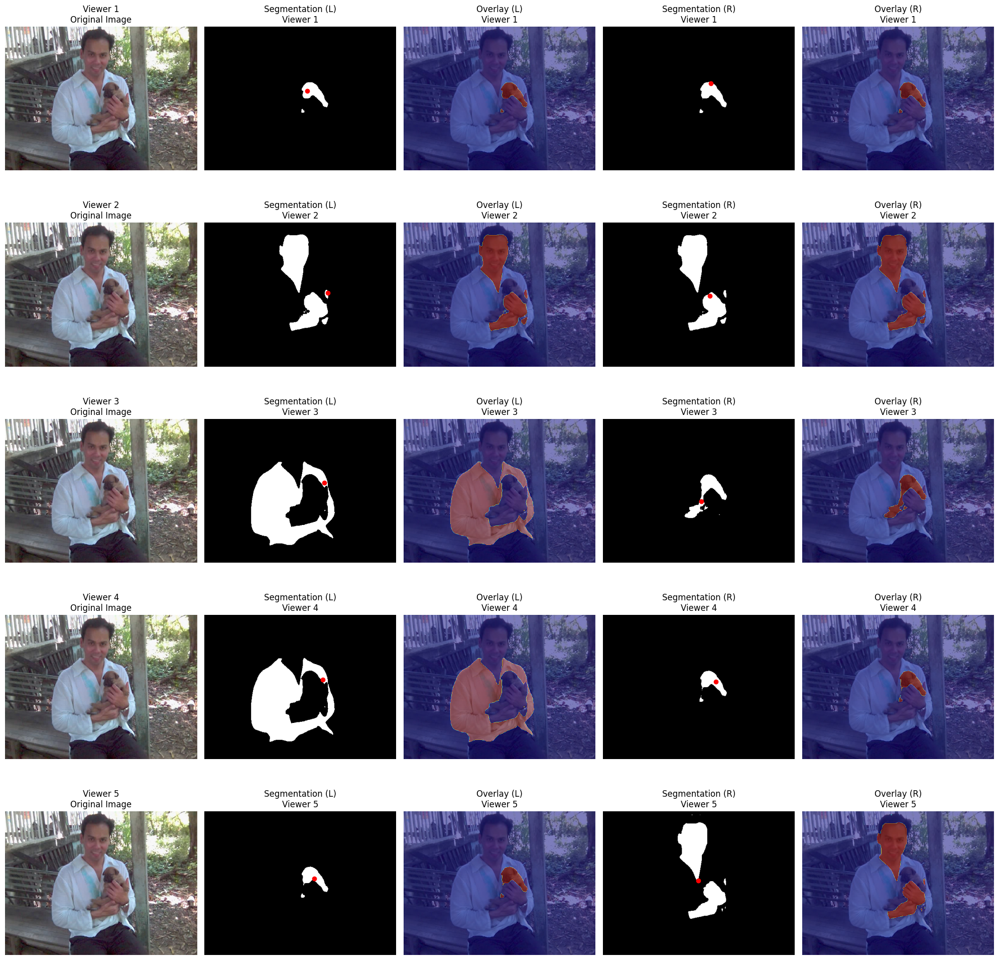

In [79]:
# Define the target image and viewers
target_image = "2008_000026"
viewers = [1, 2, 3, 4, 5]

# Create a 5x5 plot
fig, ax = plt.subplots(5, 5, figsize=(20, 20))

for row, target_viewer in enumerate(viewers):
    # Filter for the current viewer and target image
    filtered_row = df[(df['viewer'] == target_viewer) & (df['image_file'] == target_image)]
    
    if not filtered_row.empty:
        # Get the longest fixation points for left and right eyes
        longest_fixation_point_left = filtered_row.iloc[0]['longest_duration_point_left']
        longest_fixation_point_right = filtered_row.iloc[0]['longest_duration_point_right']
        example_points_left = [longest_fixation_point_left]  # Convert to list of tuples
        example_points_right = [longest_fixation_point_right]

        # Display the original image
        ax[row, 0].imshow(image)
        ax[row, 0].set_title(f"Viewer {target_viewer}\nOriginal Image")
        ax[row, 0].axis("off")

        # Segmentation mask from left points
        mask_from_points_left = run_sam_with_points(example_points_left)
        ax[row, 1].imshow(mask_from_points_left, cmap="gray")
        x_points, y_points = zip(*example_points_left)
        ax[row, 1].scatter(x_points, y_points, color="red")
        ax[row, 1].set_title(f"Segmentation (L)\nViewer {target_viewer}")
        ax[row, 1].axis("off")

        # Overlay left mask on image
        ax[row, 2].imshow(image)
        ax[row, 2].imshow(mask_from_points_left, cmap="jet", alpha=0.5)
        ax[row, 2].set_title(f"Overlay (L)\nViewer {target_viewer}")
        ax[row, 2].axis("off")

        # Segmentation mask from right points
        mask_from_points_right = run_sam_with_points(example_points_right)
        ax[row, 3].imshow(mask_from_points_right, cmap="gray")
        x_points, y_points = zip(*example_points_right)
        ax[row, 3].scatter(x_points, y_points, color="red")
        ax[row, 3].set_title(f"Segmentation (R)\nViewer {target_viewer}")
        ax[row, 3].axis("off")

        # Overlay right mask on image
        ax[row, 4].imshow(image)
        ax[row, 4].imshow(mask_from_points_right, cmap="jet", alpha=0.5)
        ax[row, 4].set_title(f"Overlay (R)\nViewer {target_viewer}")
        ax[row, 4].axis("off")
    else:
        # Handle missing data
        for col in range(5):
            ax[row, col].axis("off")
            if col == 0:
                ax[row, col].set_title(f"Viewer {target_viewer}\nNo Data")

plt.tight_layout()
plt.show()

Viewer 1: Both points segment the image correctly.
Viewer 2: Even though the fixation point of the right eye lies on the object to be detected, the segmentation is not as expected.
Viewer 3: Right fixation point segments correctly.
Viewer 4: Right fixation point segements correctly.
Viewer 5: Left fixation point segments correctly.

How can we identify which eye should be chosen in order to segment the image as wanted?
$\rightarrow$ manually inspect the values for viewer 3,4,5 here. Was the R,R,L eye the dominant in these cases? How can the dominant eye be determined? Is the number of fixation points higher for these eyes for this image?


In [80]:
filtered_df = df[df['image_file'] == target_image]
filtered_df

,class,image_file,width_height,offset,viewer,response,image_coordinates_left,image_start_end_time_left,image_duration_left,image_coordinates_right,image_start_end_time_right,image_duration_right,screen_coordinates_left,screen_coordinates_right,longest_duration_point_left,longest_duration_point_right
12465,dog,2008_000026,"[375, 500, 3]","[753, 441, 1253, 816]",1,1,"[(49.299999999999955, -40.19999999999999), (-30.700000000000045, 88.20000000000005), (222.89999999999998, 119.70000000000005), (268.4, 167.70000000000005)]","[(7, 70), (103, 206), (260, 417), (453, 820)]","[63, 103, 157, 367]","[(69.89999999999998, -59.39999999999998), (-16.0, 61.60000000000002), (245.79999999999995, 109.5), (280.4000000000001, 147.60000000000002)]","[(7, 73), (100, 206), (259, 419), (445, 820)]","[66, 106, 160, 375]","[(802.3, 400.8), (722.3, 529.2), (975.9, 560.7), (1021.4, 608.7)]","[(822.9, 381.6), (737.0, 502.6), (998.8, 550.5), (1033.4, 588.6)]","(268.4, 167.70000000000005)","(280.4000000000001, 147.60000000000002)"
12466,dog,2008_000026,"[375, 500, 3]","[753, 441, 1253, 816]",2,1,"[(119.10000000000002, 149.39999999999998), (271.0, 134.0), (321.0999999999999, 182.5), (307.79999999999995, 211.89999999999998), (277.79999999999995, 117.39999999999998)]","[(7, 188), (229, 378), (398, 752), (761, 913), (943, 979)]","[181, 149, 354, 152, 36]","[(81.70000000000005, 139.20000000000005), (221.10000000000002, 137.20000000000005), (278.20000000000005, 190.89999999999998), (259.70000000000005, 221.89999999999998), (232.5, 120.29999999999995)]","[(7, 188), (225, 377), (399, 751), (761, 910), (940, 1054)]","[181, 152, 352, 149, 114]","[(872.1, 590.4), (1024.0, 575.0), (1074.1, 623.5), (1060.8, 652.9), (1030.8, 558.4)]","[(834.7, 580.2), (974.1, 578.2), (1031.2, 631.9), (1012.7, 662.9), (985.5, 561.3)]","(321.0999999999999, 182.5)","(278.20000000000005, 190.89999999999998)"
12467,dog,2008_000026,"[375, 500, 3]","[753, 441, 1253, 816]",3,1,"[(76.20000000000005, 87.70000000000005), (290.79999999999995, 109.70000000000005), (330.20000000000005, 155.29999999999995), (311.70000000000005, 167.0)]","[(7, 175), (210, 352), (379, 554), (566, 1059)]","[168, 142, 175, 493]","[(40.299999999999955, 107.10000000000002), (245.0, 134.70000000000005), (275.9000000000001, 205.70000000000005), (255.70000000000005, 215.20000000000005)]","[(7, 175), (207, 353), (378, 552), (563, 1059)]","[168, 146, 174, 496]","[(829.2, 528.7), (1043.8, 550.7), (1083.2, 596.3), (1064.7, 608.0)]","[(793.3, 548.1), (998.0, 575.7), (1028.9, 646.7), (1008.7, 656.2)]","(311.70000000000005, 167.0)","(255.70000000000005, 215.20000000000005)"
12468,dog,2008_000026,"[375, 500, 3]","[753, 441, 1253, 816]",4,1,"[(266.29999999999995, 102.70000000000005), (308.4000000000001, 168.5)]","[(210, 366), (391, 675)]","[156, 284]","[(256.20000000000005, 113.70000000000005), (293.79999999999995, 173.10000000000002)]","[(213, 367), (390, 1088)]","[154, 698]","[(1019.3, 543.7), (1061.4, 609.5)]","[(1009.2, 554.7), (1046.8, 614.1)]","(308.4000000000001, 168.5)","(293.79999999999995, 173.10000000000002)"
12469,dog,2008_000026,"[375, 500, 3]","[753, 441, 1253, 816]",5,1,"[(132.10000000000002, 104.70000000000005), (271.5999999999999, 95.79999999999995), (286.70000000000005, 176.0), (261.79999999999995, 98.60000000000002)]","[(7, 199), (229, 376), (400, 776), (808, 1032)]","[192, 147, 376, 224]","[(84.20000000000005, 83.60000000000002), (224.79999999999995, 98.60000000000002), (247.89999999999998, 180.39999999999998), (209.89999999999998, 94.0)]","[(7, 196), (228, 378), (402, 777), (804, 1032)]","[189, 150, 375, 228]","[(885.1, 545.7), (1024.6, 536.8), (1039.7, 617.0), (1014.8, 539.6)]","[(837.2, 524.6), (977.8, 539.6), (1000.9, 621.4), (962.9, 535.0)]","(286.70000000000005, 176.0)","(247.89999999999998, 180.39999999999998)"


The number of fixation points for viewer 3,4,5 is the same for both eyes. Thus, this is not the factor explaining the better accuracy. However, for viewer 3 and 4 the right eye has the fixation point with the longest duration, and similarly, viewer 5 shows the longest duration for a fixation point from the left point.

### Now for all images

Further ideas which point should be passed to SAM:
1) longest duration point (done)
2) last fixation point


In [74]:
def plot_image_viewers(image_path, target_image, df, predictor, viewers=[1, 2, 3, 4, 5]):
    """
    Generate a 5x5 plot for a single image with segmentation and overlay for multiple viewers.

    Parameters:
    - image_path (str): Path to the image file.
    - target_image (str): Identifier for the image in the dataframe (e.g., "2008_000026").
    - df (pd.DataFrame): Dataframe containing fixation points and related metadata.
    - predictor: SAM predictor object for generating segmentation masks.
    - viewers (list): List of viewer IDs to process. Default is [1, 2, 3, 4, 5].

    Returns:
    - None (Displays and optionally saves the plot)
    """
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

    # Set the image in the predictor
    predictor.set_image(image)

    # Create a 5x5 plot
    fig, ax = plt.subplots(5, 5, figsize=(20, 20))

    for row, target_viewer in enumerate(viewers):
        # Filter for the current viewer and target image
        filtered_row = df[(df['viewer'] == target_viewer) & (df['image_file'] == target_image)]

        if not filtered_row.empty:
            # Get the longest fixation points for left and right eyes
            longest_fixation_point_left = filtered_row.iloc[0]['longest_duration_point_left']
            longest_fixation_point_right = filtered_row.iloc[0]['longest_duration_point_right']

            # Handle case where fixation points might be NaN or (NaN, NaN)
            if isinstance(longest_fixation_point_left, tuple):
                if np.isnan(longest_fixation_point_left[0]) or np.isnan(longest_fixation_point_left[1]):
                    longest_fixation_point_left = None
            elif np.isnan(longest_fixation_point_left):
                longest_fixation_point_left = None

            if isinstance(longest_fixation_point_right, tuple):
                if np.isnan(longest_fixation_point_right[0]) or np.isnan(longest_fixation_point_right[1]):
                    longest_fixation_point_right = None
            elif np.isnan(longest_fixation_point_right):
                longest_fixation_point_right = None

            # Check if fixation points are None (missing)
            if longest_fixation_point_left is None or longest_fixation_point_right is None:
                # Handle missing data by making all subplots empty
                for col in range(5):
                    ax[row, col].axis("off")
                    if col == 0:
                        ax[row, col].set_title(f"Viewer {target_viewer}\nNo Data")
            else:
                # Valid fixation points: process and display
                example_points_left = [longest_fixation_point_left]
                example_points_right = [longest_fixation_point_right]

                # Display the original image
                ax[row, 0].imshow(image)
                ax[row, 0].set_title(f"Viewer {target_viewer}\nOriginal Image")
                ax[row, 0].axis("off")

                # Segmentation mask from left points
                mask_from_points_left = run_sam_with_points(example_points_left)
                ax[row, 1].imshow(mask_from_points_left, cmap="gray")
                x_points, y_points = zip(*example_points_left)
                ax[row, 1].scatter(x_points, y_points, color="red")
                ax[row, 1].set_title(f"Segmentation (L)\nViewer {target_viewer}")
                ax[row, 1].axis("off")

                # Overlay left mask on image
                ax[row, 2].imshow(image)
                ax[row, 2].imshow(mask_from_points_left, cmap="jet", alpha=0.5)
                ax[row, 2].set_title(f"Overlay (L)\nViewer {target_viewer}")
                ax[row, 2].axis("off")

                # Segmentation mask from right points
                mask_from_points_right = run_sam_with_points(example_points_right)
                ax[row, 3].imshow(mask_from_points_right, cmap="gray")
                x_points, y_points = zip(*example_points_right)
                ax[row, 3].scatter(x_points, y_points, color="red")
                ax[row, 3].set_title(f"Segmentation (R)\nViewer {target_viewer}")
                ax[row, 3].axis("off")

                # Overlay right mask on image
                ax[row, 4].imshow(image)
                ax[row, 4].imshow(mask_from_points_right, cmap="jet", alpha=0.5)
                ax[row, 4].set_title(f"Overlay (R)\nViewer {target_viewer}")
                ax[row, 4].axis("off")
        else:
            # Handle missing data if no fixation points found in the dataframe
            for col in range(5):
                ax[row, col].axis("off")
                if col == 0:
                    ax[row, col].set_title(f"Viewer {target_viewer}\nNo Data")

    plt.tight_layout()
    plt.show()


Processing 2008_000162...


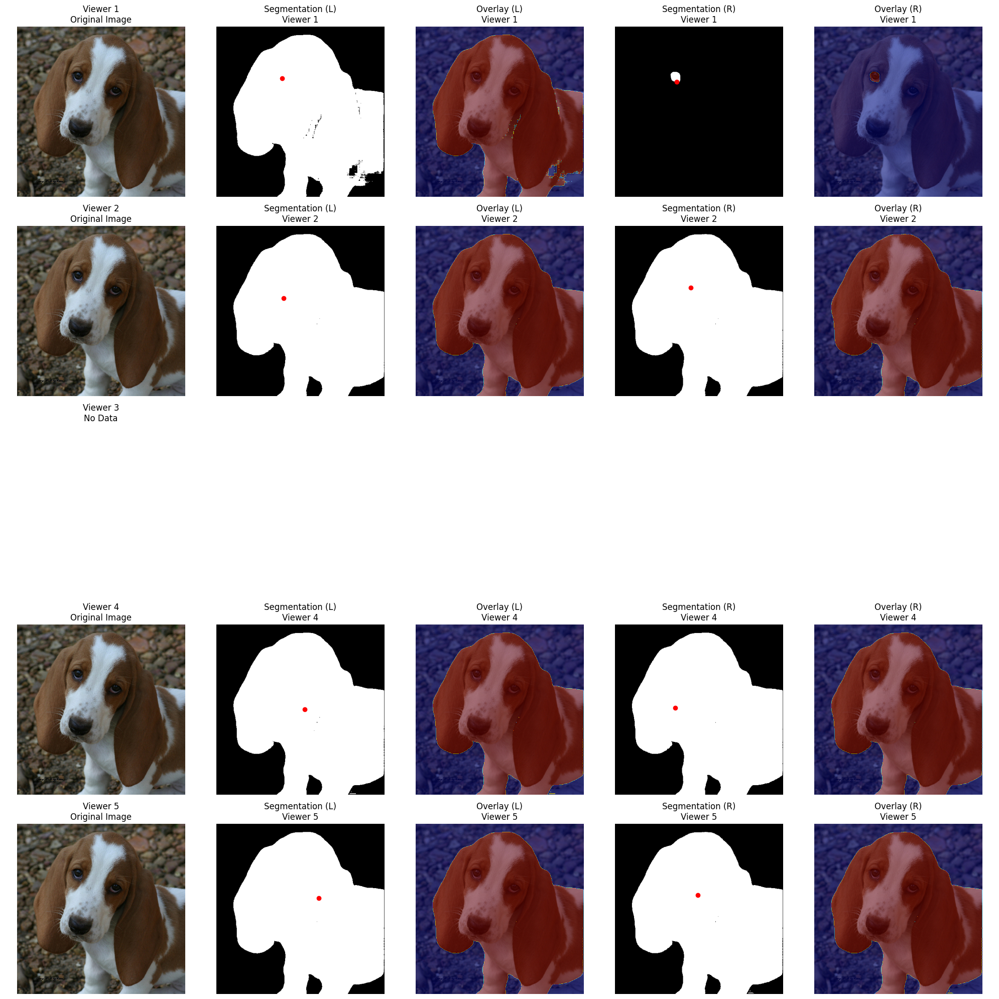

Processing 2008_000066...


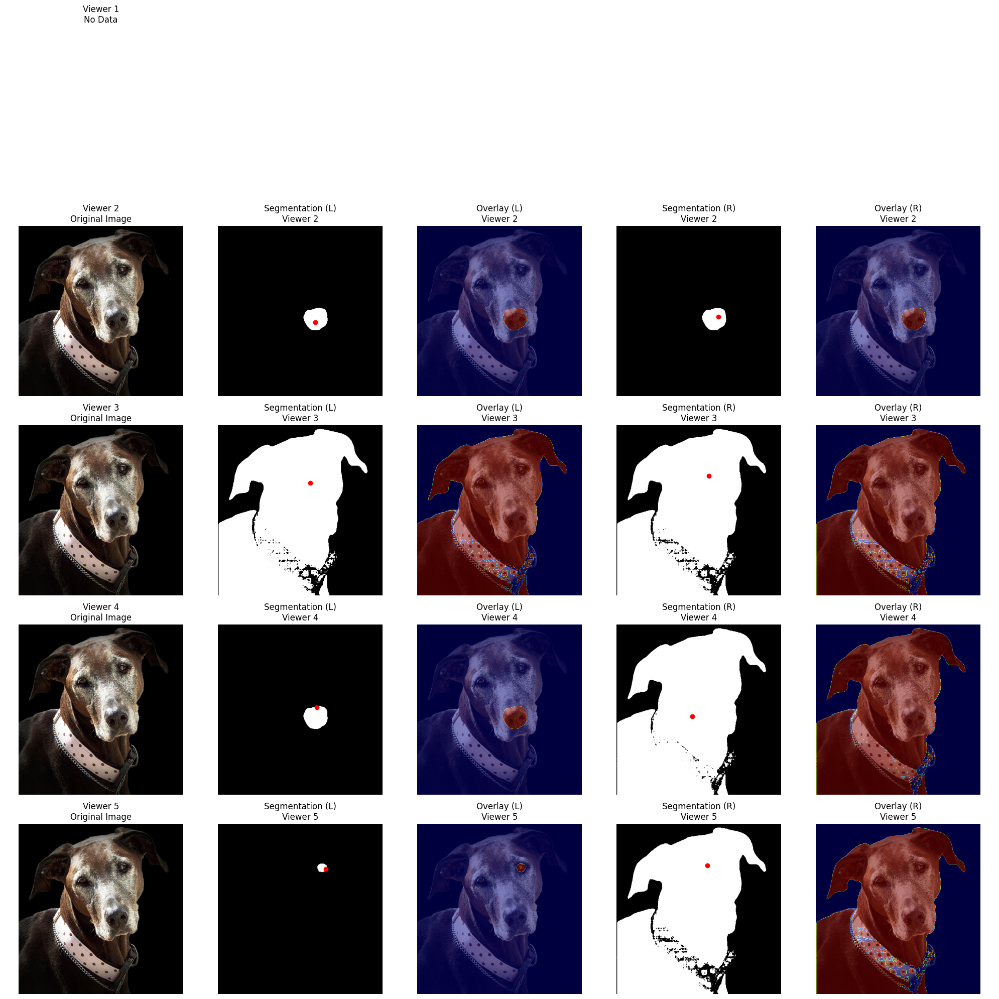

Processing 2008_000099...


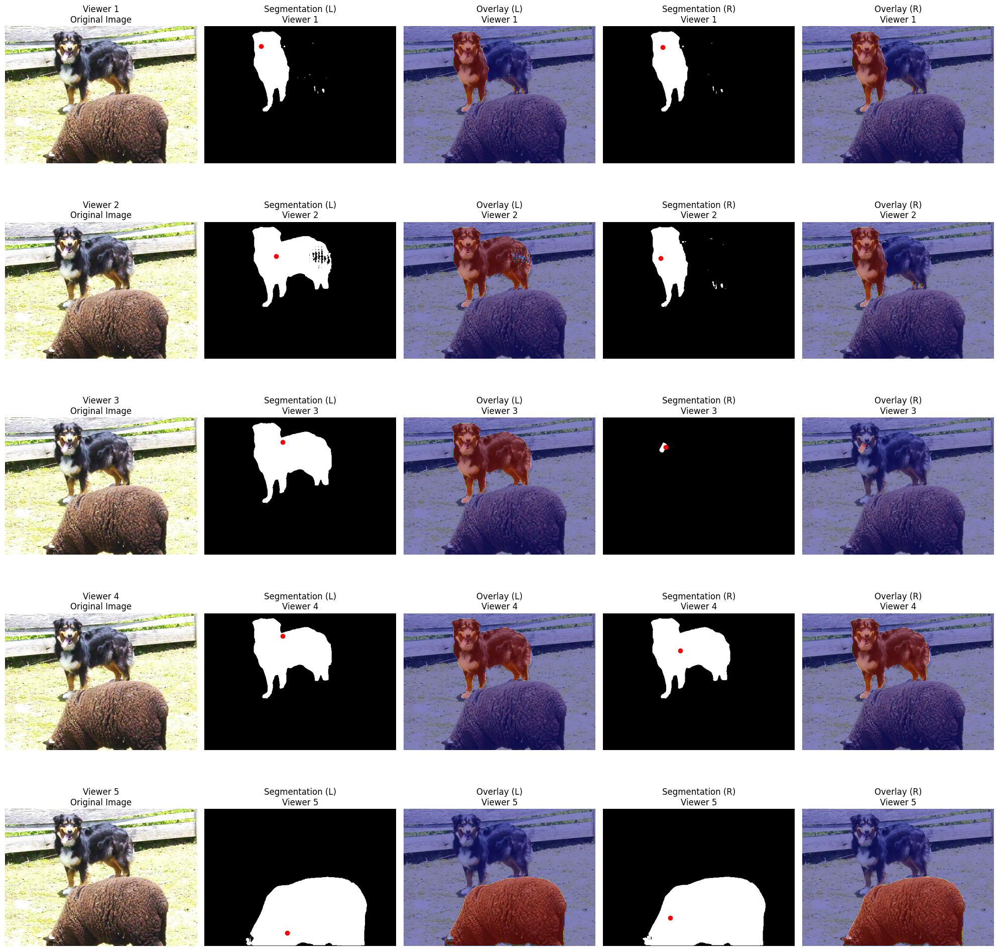

Processing 2008_000138...


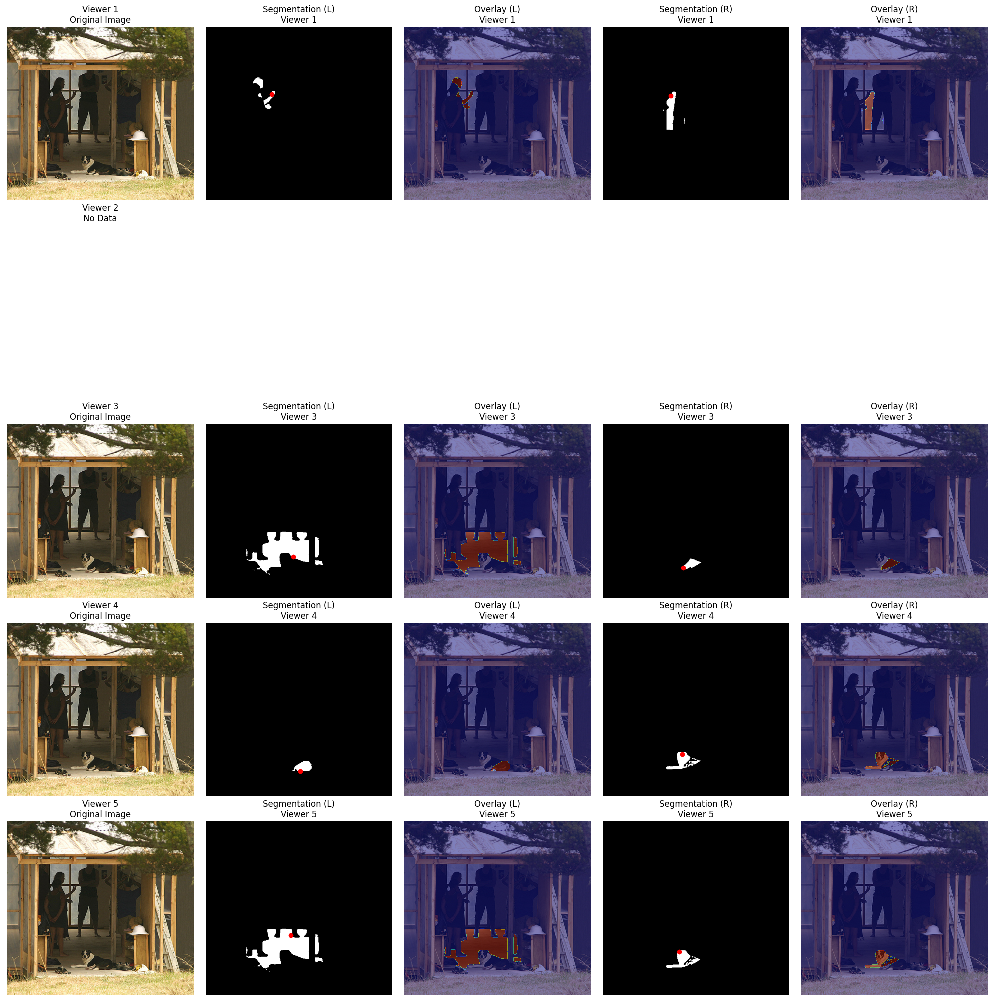

Processing 2008_000053...


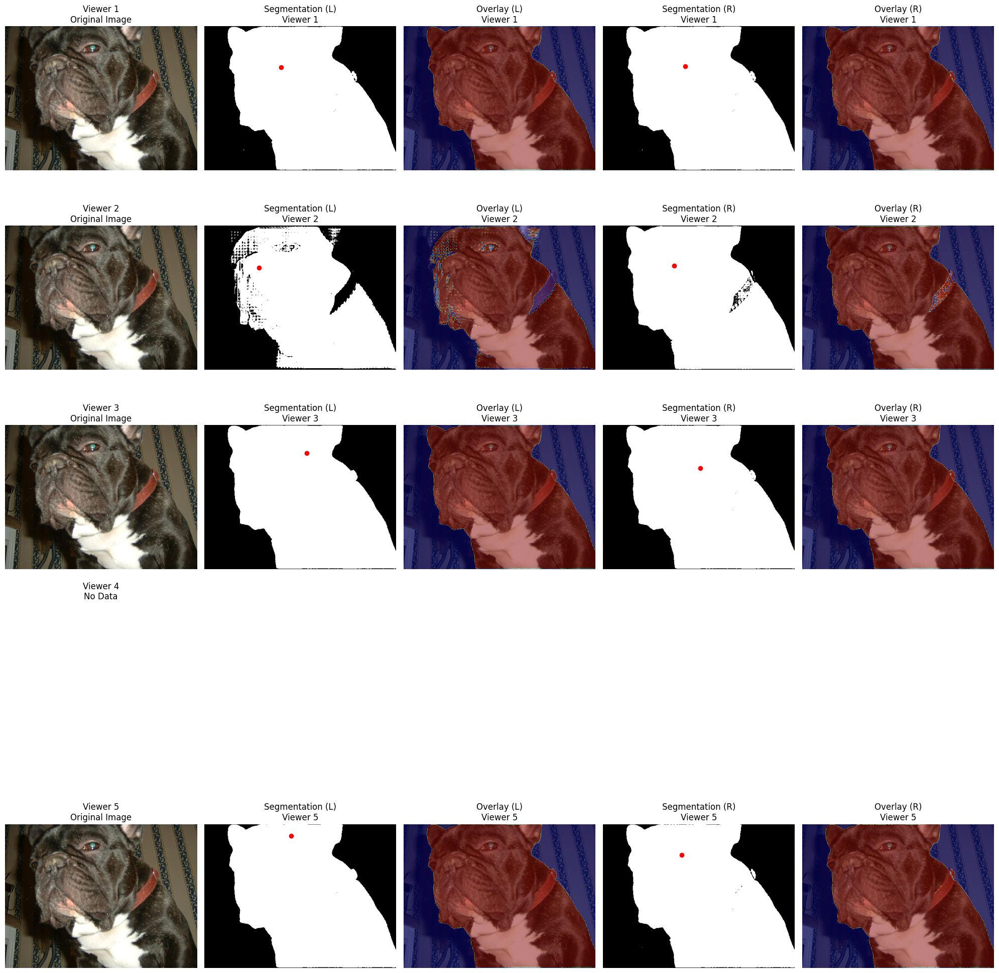

In [81]:
data_folder = '/kaggle/input/dog-images-subset'
#image_file = 'dog_2008_000026.jpg'
#image_path = os.path.join(data_folder, image_file)
#target_image = "2008_000026"
# Call the function
#plot_image_viewers(image_path, target_image, df, predictor)

# Get all image file paths in the folder
image_files = [os.path.join(data_folder, file) for file in os.listdir(data_folder) if file.endswith(('.jpg', '.png', '.jpeg'))]
image_files = image_files[:5]

# Extract the base names (e.g., "2008_000026" without extension or "dog_2008_000026" depending on your naming)
base_file_names = [os.path.splitext(file)[0].split("_", 1)[-1] for file in os.listdir(data_folder) if file.endswith(('.jpg', '.png', '.jpeg'))]

# Combine paths and base names for easy access
images = list(zip(image_files, base_file_names))

for image_path, target_image in images:
    print(f"Processing {target_image}...")
    plot_image_viewers(image_path, target_image, df, predictor)
